In [4]:
# -*- coding: utf-8 -*-
%matplotlib inline
import numpy as np
import cv2
import glob
import re
from matplotlib import pyplot as plt
import time as t
print "OpenCV version: {}".format(cv2.__version__)
# https://wiki.python.org/moin/PythonSpeed/PerformanceTips

OpenCV version: 2.4.11


In [5]:
w = 640
h = 480

criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)
crit = criteria

objp = np.zeros((9*6,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2) * 30

fig_size = plt.rcParams["figure.figsize"]
# print "Current size:", fig_size
fig_size[0] = 18
fig_size[1] = 12
plt.rcParams["figure.figsize"] = fig_size

## Usando imágenes de ejemplo

Calibración estéreo

left01.jpg True
right01.jpg True


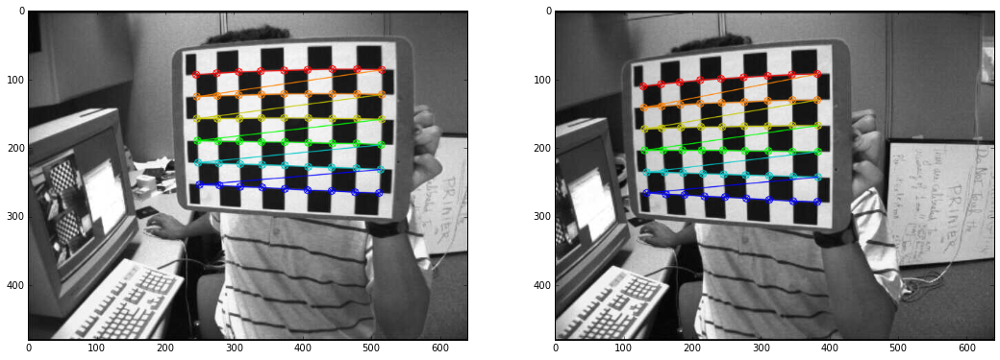

left02.jpg True
right02.jpg True


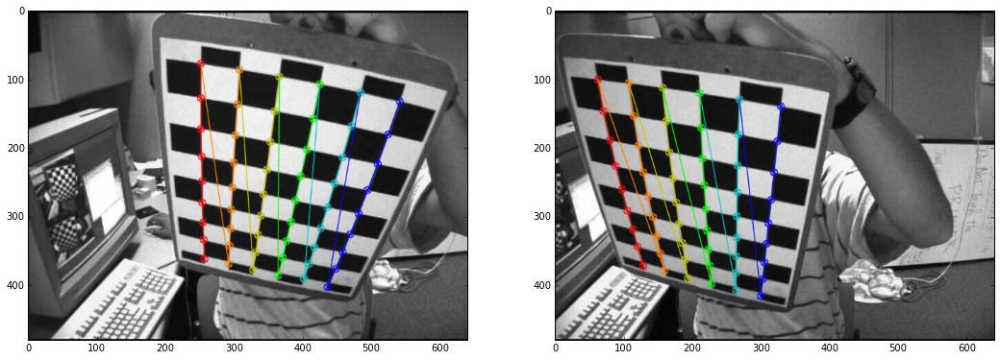

left03.jpg True
right03.jpg True


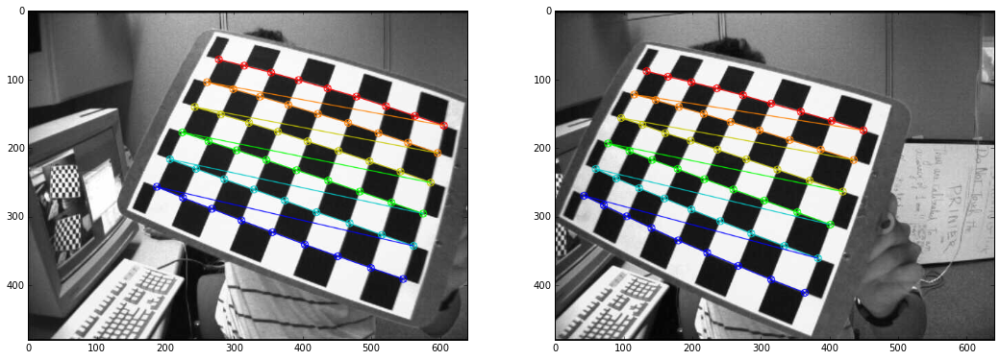

left04.jpg True
right04.jpg True


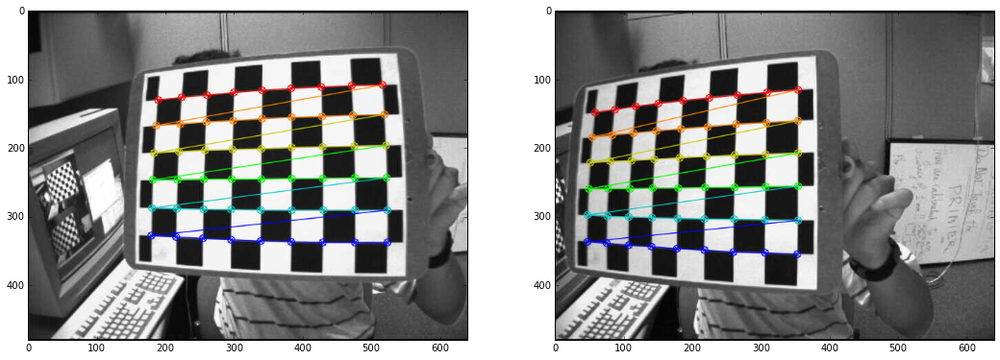

left05.jpg True
right05.jpg True


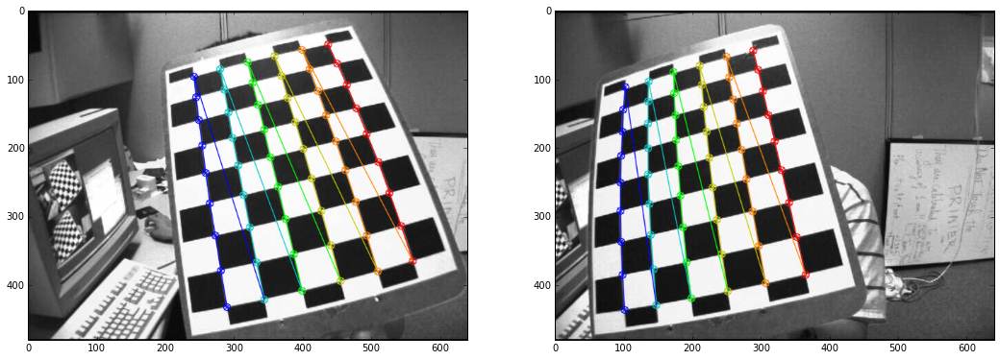

left06.jpg True
right06.jpg True


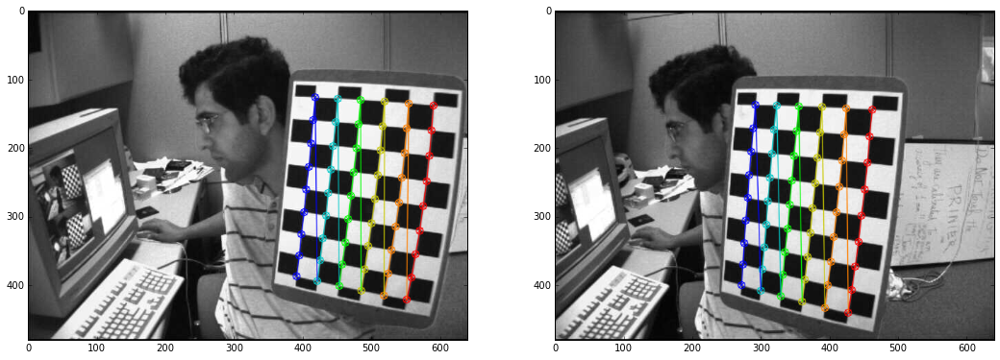

left07.jpg True
right07.jpg True


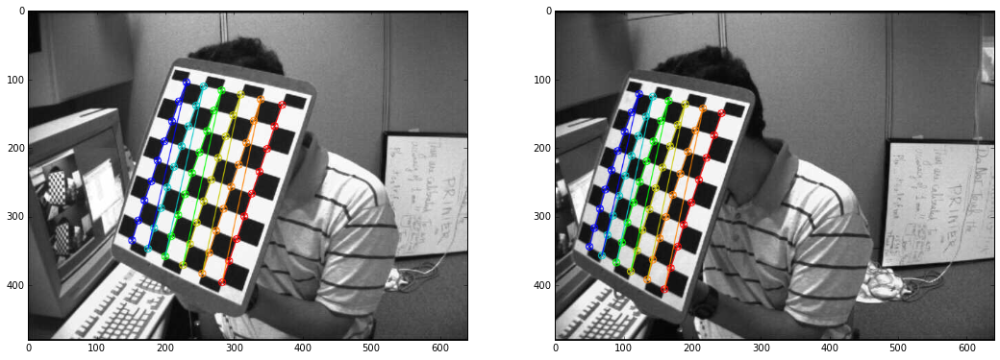

left08.jpg True
right08.jpg True


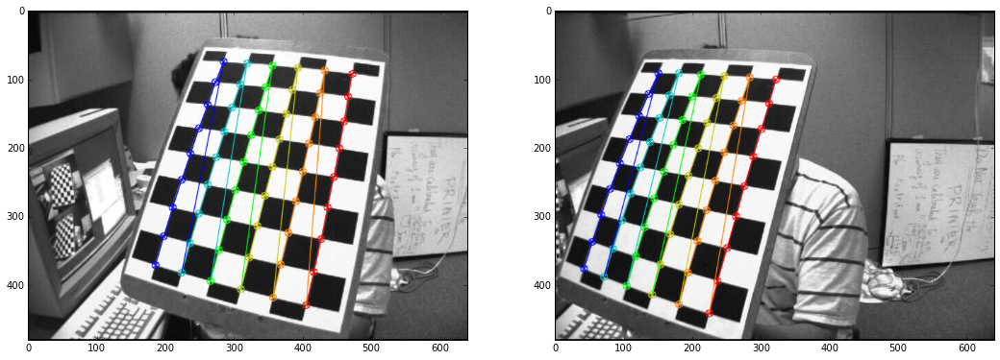

left09.jpg True
right09.jpg True


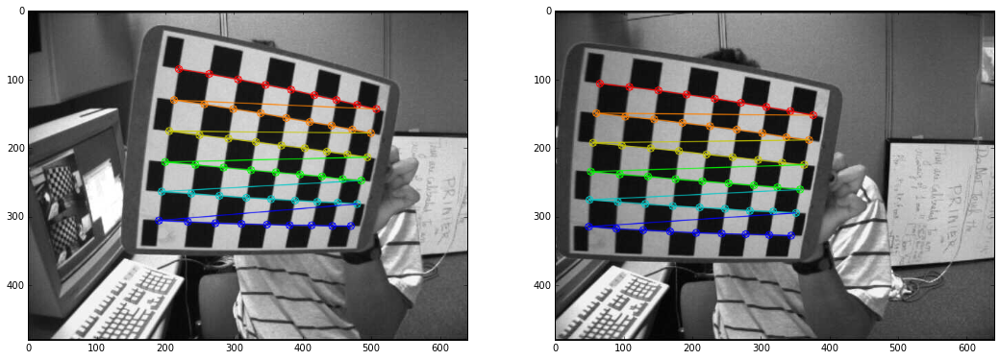

left10.jpg True
right10.jpg True


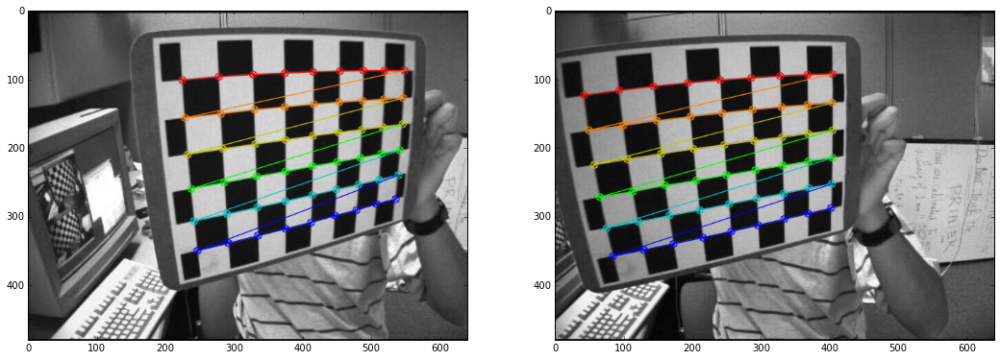

left11.jpg True
right11.jpg True


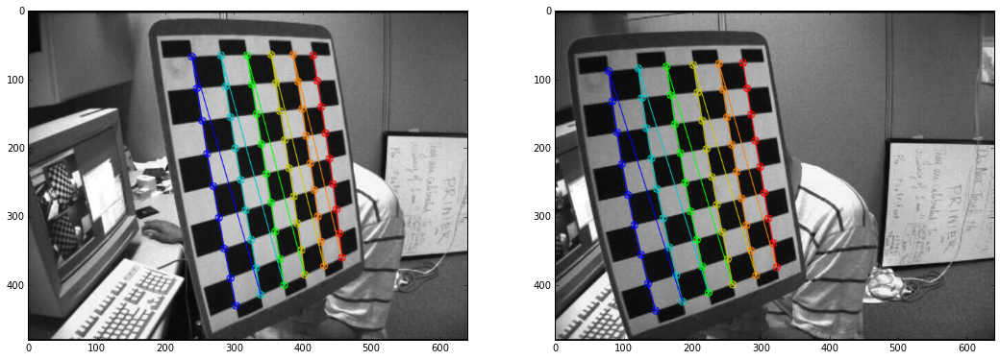

left12.jpg True
right12.jpg True


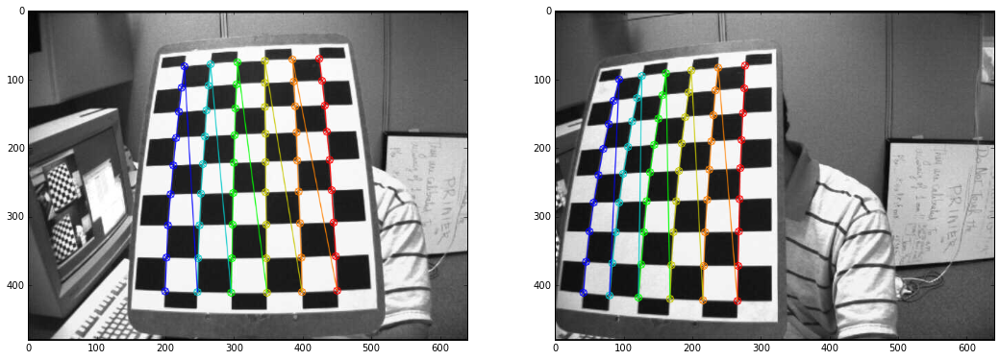

left13.jpg True
right13.jpg True


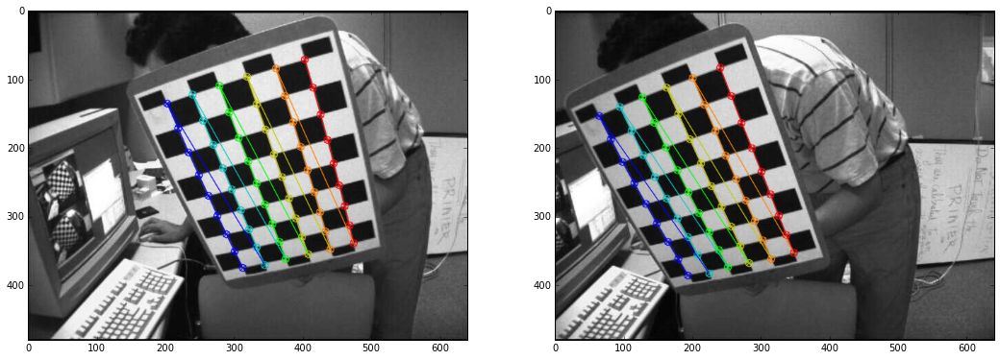

left14.jpg True
right14.jpg True


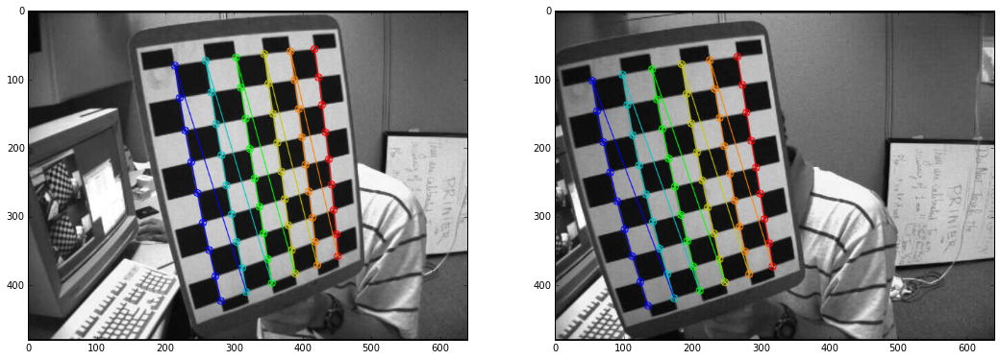

In [6]:
# http://www.vision.caltech.edu/bouguetj/calib_doc/htmls/example5.html
objpoints = []
imgpointsL = []
imgpointsR = []

imagesL = glob.glob('stereo-example/left*.jpg')
imagesR = glob.glob('stereo-example/right*.jpg')

for fnameL, fnameR in zip(imagesL, imagesR):
    imgL = cv2.imread(fnameL)
    imgR = cv2.imread(fnameR)
    grayL = cv2.cvtColor(imgL,cv2.COLOR_BGR2GRAY)
    grayR = cv2.cvtColor(imgR,cv2.COLOR_BGR2GRAY)

    retL, cornersL = cv2.findChessboardCorners(grayL, (9,6), None)
    retR, cornersR = cv2.findChessboardCorners(grayR, (9,6), None)
    
    name1 = re.findall(r'[\w\d\-]+\.\w+',fnameL)[0]
    name2 = re.findall(r'[\w\d\-]+\.\w+',fnameR)[0]
    print name1, retL
    print name2, retR
    
    cv2.cornerSubPix(grayL, cornersL, (11,11), (-1,-1), criteria)
    cv2.drawChessboardCorners(imgL, (9,6), cornersL, retL)
    
    cv2.cornerSubPix(grayR, cornersR, (11,11), (-1,-1), criteria)
    cv2.drawChessboardCorners(imgR, (9,6), cornersR, retR)
    
    objpoints.append(objp)
    imgpointsL.append(cornersL)
    imgpointsR.append(cornersR)
    
    imgL = cv2.cvtColor(imgL, cv2.COLOR_BGR2RGB)
    imgR = cv2.cvtColor(imgR, cv2.COLOR_BGR2RGB)
    plt.subplot(1,2,1), plt.imshow(imgL)
    plt.subplot(1,2,2), plt.imshow(imgR)
    plt.show()

retL, mtxL, distL, rvecsL, tvecsL = cv2.calibrateCamera(objpoints, imgpointsL, (w,h), None, None)
retR, mtxR, distR, rvecsR, tvecsR = cv2.calibrateCamera(objpoints, imgpointsR, (w,h), None, None)

In [7]:
print "Matriz cámara izquierda:\n{}\n".format(mtxL)
print "Matriz cámara derecha:\n{}".format(mtxR)

Matriz cámara izquierda:
[[ 536.3170975     0.          341.83900807]
 [   0.          536.32172425  235.60188855]
 [   0.            0.            1.        ]]

Matriz cámara derecha:
[[ 541.43230582    0.          327.6734469 ]
 [   0.          540.83340359  247.71738045]
 [   0.            0.            1.        ]]


In [8]:
errL = 0
errR = 0

for i in xrange(len(objpoints)):
    imgpoints2L, _ = cv2.projectPoints(objpoints[i], rvecsL[i], tvecsL[i], mtxL, distL)
    imgpoints2R, _ = cv2.projectPoints(objpoints[i], rvecsR[i], tvecsR[i], mtxR, distR)
    errorL = cv2.norm(imgpointsL[i],imgpoints2L, cv2.NORM_L2) / len(imgpoints2L)
    errorR = cv2.norm(imgpointsR[i],imgpoints2R, cv2.NORM_L2) / len(imgpoints2R)
    errL += errorL
    errR += errorR

print "Error izquierda:   {}\n".format(errL/len(objpoints))
print "Error derecha:     {}".format(errR/len(objpoints))

Error izquierda:   0.0417441617641

Error derecha:     0.0476887110115


True
[[ 1.  0.  0.]
 [ 0.  1.  0.]
 [ 0.  0.  1.]]


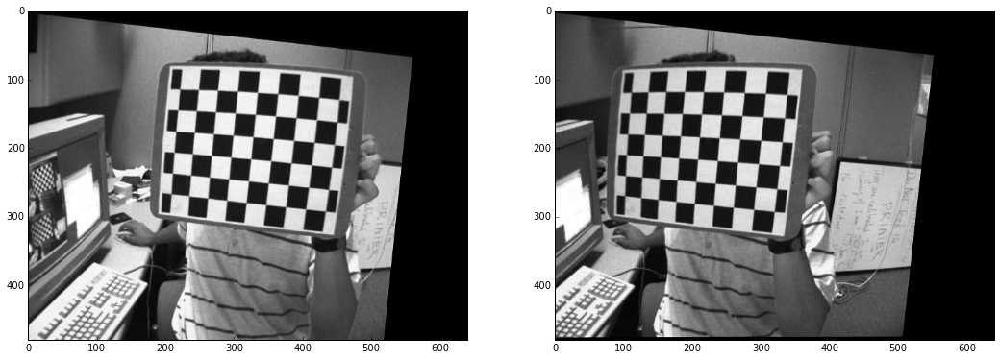

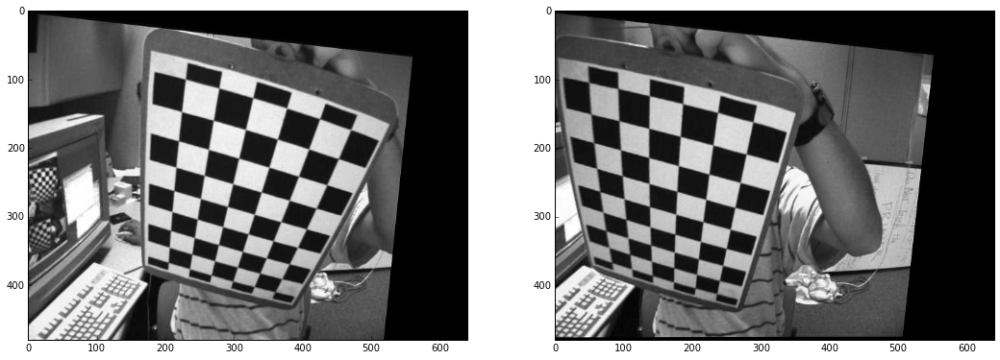

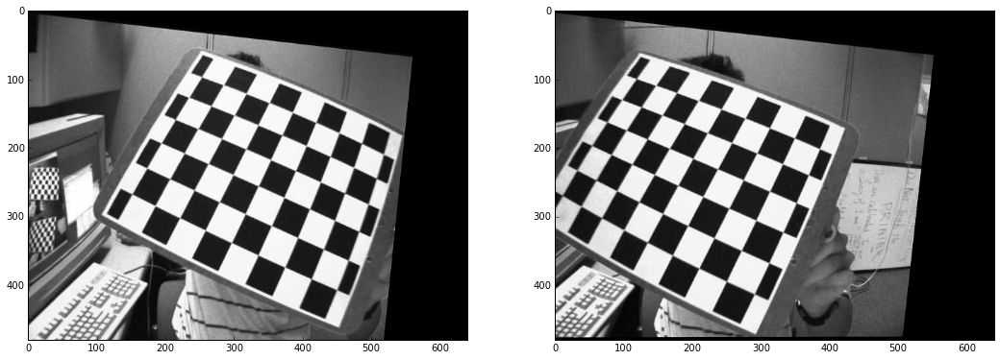

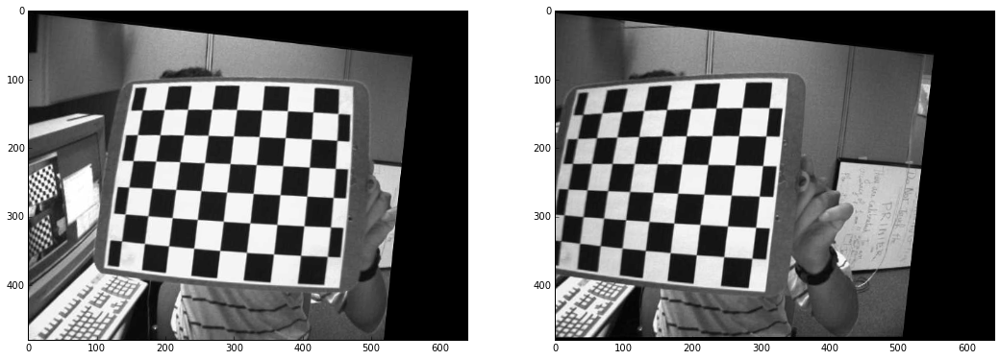

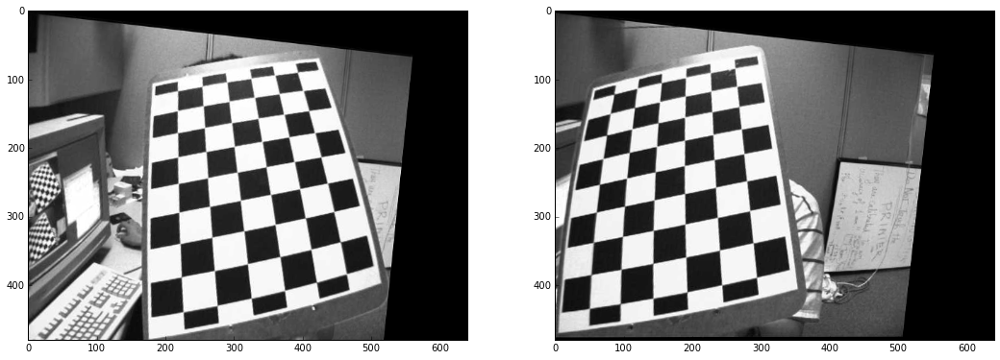

...

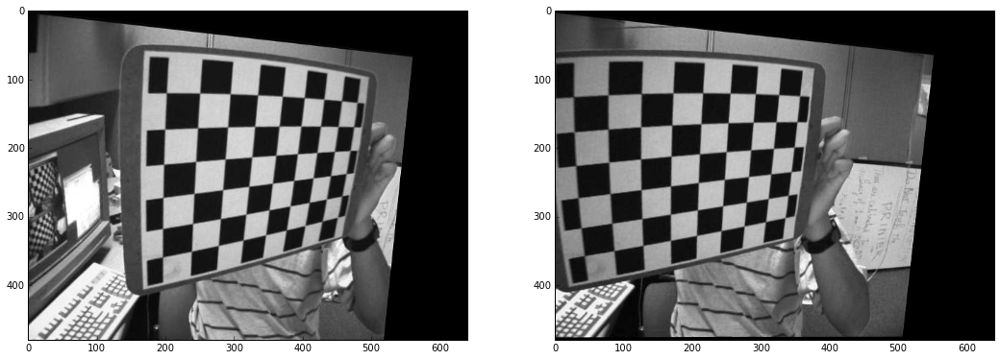

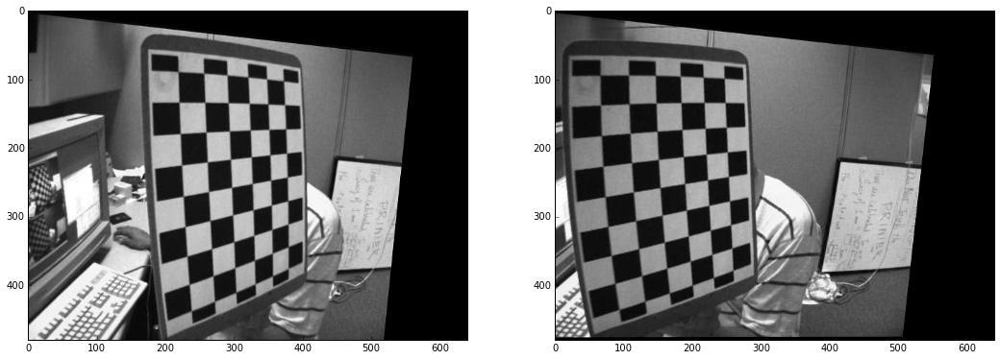

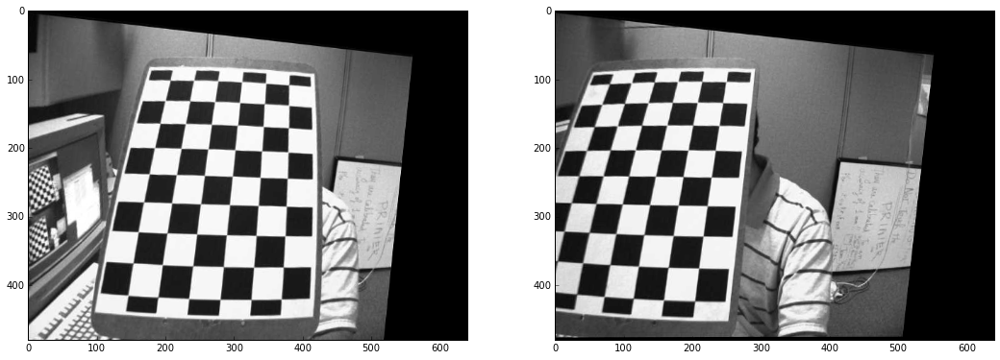

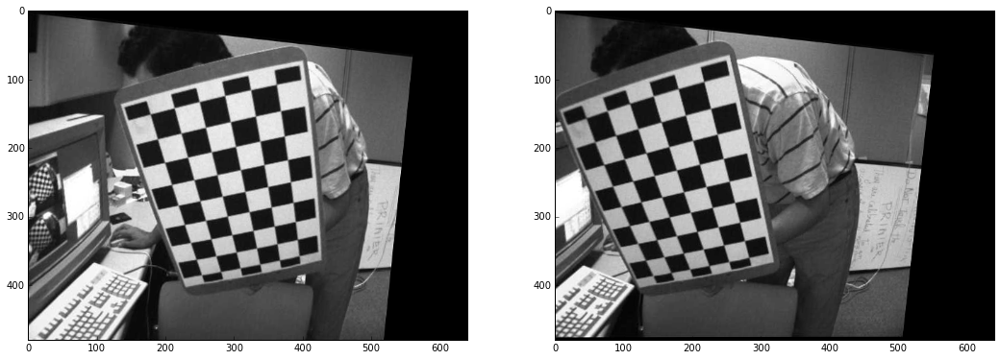

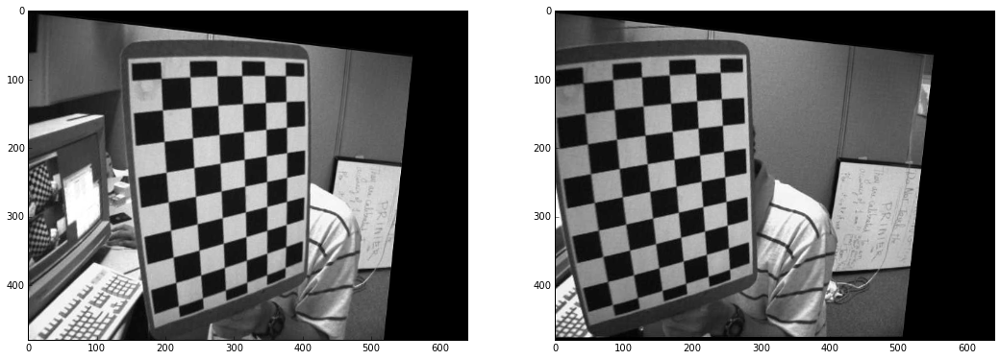

In [9]:
objpoints1 = []
imgpoints1 = []
objpoints2 = []
imgpoints2 = []

for fnameL, fnameR in zip(imagesL, imagesR):
    imgL = cv2.imread(fnameL)
    imgR = cv2.imread(fnameR)
    grayL = cv2.cvtColor(imgL,cv2.COLOR_BGR2GRAY)
    grayR = cv2.cvtColor(imgR,cv2.COLOR_BGR2GRAY)

    retL, cornersL = cv2.findChessboardCorners(grayL, (9,6), None)
    retR, cornersR = cv2.findChessboardCorners(grayR, (9,6), None)
    
    if retL is True:
        objpoints1.append(objp)

        cv2.cornerSubPix(grayL,cornersL,(11,11),(-1,-1),criteria)
        imgpoints1.append(cornersL)

    if retR is True:
        objpoints2.append(objp)

        cv2.cornerSubPix(grayR,cornersR,(11,11),(-1,-1),criteria)
        imgpoints2.append(cornersR)

print objpoints1 == objpoints2

ret, mtxL, distL, mtxR, distR, R, T, E, F  = cv2.stereoCalibrate(objpoints1, imgpoints1, imgpoints2, (640,480),
                                                                 flags=cv2.CALIB_SAME_FOCAL_LENGTH+cv2.CALIB_FIX_INTRINSIC+cv2.CALIB_FIX_ASPECT_RATIO+cv2.CALIB_USE_INTRINSIC_GUESS,
                                                                 criteria=crit)
print mtxL
R1, R2, P1, P2, Q, ROI1, ROI2 = cv2.stereoRectify(mtxL, distL, mtxR, distR, (640,480), R, T,  flags=cv2.CALIB_ZERO_DISPARITY)
map1L, map2L = cv2.initUndistortRectifyMap(mtxL, distL, R1, mtxL, (640,480), cv2.CV_32FC1)
map1R, map2R = cv2.initUndistortRectifyMap(mtxR, distR, R2, mtxR, (640,480), cv2.CV_32FC1)

for fnameL, fnameR in zip(imagesL, imagesR):
    imgL = cv2.imread(fnameL)
    imgR = cv2.imread(fnameR)
    dstL = cv2.remap(imgL, map1L, map2L, cv2.INTER_CUBIC)
    dstR = cv2.remap(imgR, map1R, map2R, cv2.INTER_CUBIC)
    dstL = cv2.cvtColor(dstL, cv2.COLOR_BGR2RGB)
    dstR = cv2.cvtColor(dstR, cv2.COLOR_BGR2RGB)
    plt.subplot(1,2,1), plt.imshow(dstL)
    plt.subplot(1,2,2), plt.imshow(dstR)
    plt.show()

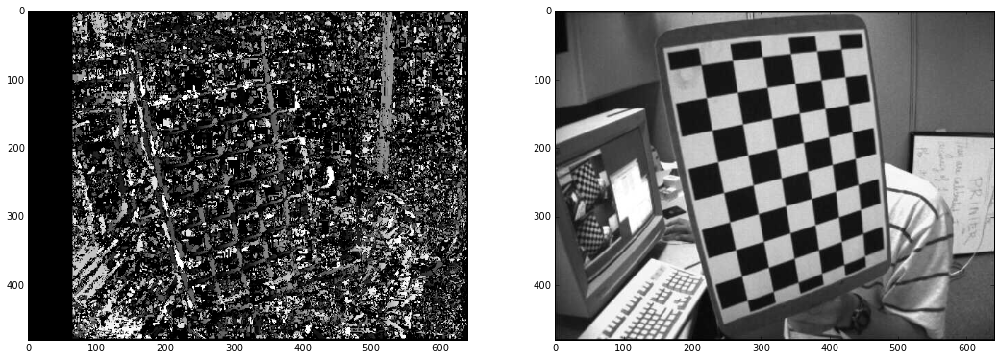

In [19]:
from IPython.html import widgets
from IPython.display import display

def depthMap(n=0, w=5):
    stereo = cv2.StereoBM(cv2.STEREO_BM_BASIC_PRESET, n, w)
    disparity = stereo.compute(grayL,grayR)
    plt.subplot(1,2,1),plt.imshow(disparity, 'gray')
    plt.subplot(1,2,2),plt.imshow(imgL)
    plt.show()
    
n_slider = widgets.IntSliderWidget(min=0, max=640, step=16, value=0)
w_slider = widgets.IntSliderWidget(min=5, max=255, step=2, value=5)

w = widgets.interactive(depthMap,n=n_slider,w=w_slider)
display(w)

In [16]:
[n for n in dir(widgets) if not n.endswith('Widget') and n[0] == n[0].upper() and not n[0] == '_']

['Accordion',
 'BoundedFloatText',
 'BoundedIntText',
 'Box',
 'Button',
 'CallbackDispatcher',
 'Checkbox',
 'Color',
 'Dropdown',
 'FlexBox',
 'FloatProgress',
 'FloatRangeSlider',
 'FloatSlider',
 'FloatText',
 'HBox',
 'HTML',
 'Image',
 'IntProgress',
 'IntRangeSlider',
 'IntSlider',
 'IntText',
 'Latex',
 'Output',
 'RadioButtons',
 'Select',
 'SelectMultiple',
 'Tab',
 'Text',
 'Textarea',
 'ToggleButton',
 'ToggleButtons',
 'VBox']

In [ ]:
help(widgets.BoundedIntTextWidget)

In [ ]:
nms = dir(cv2) # list of everything in the cv2 module
[m for m in nms if 'BORDER' in m]